In [1]:
# Initialize Otter
import otter
grader = otter.Notebook("hw5.ipynb")

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


# CPSC 330 - Applied Machine Learning 

## Homework 5: Putting it all together 
### Associated lectures: All material till lecture 13 

**Due date: [Monday, Mar 10, 11:59 pm](https://github.com/UBC-CS/cpsc330-2024W2?tab=readme-ov-file#deliverable-due-dates-tentative)**

## Table of contents
0. [Submission instructions](#si)
1. [Understanding the problem](#1)
2. [Data splitting](#2)
3. [EDA](#3)
4. [Feature engineering](#4)
5. [Preprocessing and transformations](#5) 
6. [Baseline model](#6)
7. [Linear models](#7)
8. [Different models](#8)
9. [Feature selection](#9)
10. [Hyperparameter optimization](#10)
11. [Interpretation and feature importances](#11) 
12. [Results on the test set](#12)
13. [Summary of the results](#13)
14. [Your takeaway from the course](#15)

<div class="alert alert-info">

## Submission instructions
<hr>
rubric={points:4}

**You may work with a partner on this homework and submit your assignment as a group.** Below are some instructions on working as a group.  
- The maximum group size is 2. 
- Use group work as an opportunity to collaborate and learn new things from each other. 
- Be respectful to each other and make sure you understand all the concepts in the assignment well. 
- It's your responsibility to make sure that the assignment is submitted by one of the group members before the deadline. 
- You can find the instructions on how to do group submission on Gradescope [here](https://help.gradescope.com/article/m5qz2xsnjy-student-add-group-members).
- If you would like to use late tokens for the homework, all group members must have the necessary late tokens available. Please note that the late tokens will be counted for all members of the group.   


Follow the [homework submission instructions](https://github.com/UBC-CS/cpsc330-2024W2/blob/master/docs/homework_instructions.md). 

1. Before submitting the assignment, run all cells in your notebook to make sure there are no errors by doing `Kernel -> Restart Kernel and Clear All Outputs` and then `Run -> Run All Cells`. 
2. Notebooks with cell execution numbers out of order or not starting from "1" will have marks deducted. Notebooks without the output displayed may not be graded at all (because we need to see the output in order to grade your work).
3. Follow the [CPSC 330 homework instructions](https://ubc-cs.github.io/cpsc330-2024W2/docs/homework_instructions.html), which include information on how to do your assignment and how to submit your assignment.
4. Upload your solution on Gradescope. Check out this [Gradescope Student Guide](https://lthub.ubc.ca/guides/gradescope-student-guide/) if you need help with Gradescope submission. 
5. Make sure that the plots and output are rendered properly in your submitted file. If the .ipynb file is too big and doesn't render on Gradescope, also upload a pdf or html in addition to the .ipynb so that the TAs can view your submission on Gradescope.


_Note: The assignments will get gradually more open-ended as we progress through the course. In many cases, there won't be a single correct solution. Sometimes you will have to make your own choices and your own decisions (for example, on what parameter values to use when they are not explicitly provided in the instructions). Use your own judgment in such cases and justify your choices, if necessary._

</div>

<!-- BEGIN QUESTION -->

## Imports

<div class="alert alert-warning">
    
Imports
    
</div>

_Points:_ 0

In [2]:
import os
import matplotlib.pyplot as plt
import numpy as np
import shap
import pandas as pd
from sklearn.compose import (
    ColumnTransformer,
    TransformedTargetRegressor,
    make_column_transformer,
)
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.metrics import make_scorer, mean_squared_error, r2_score
from sklearn.model_selection import (
    GridSearchCV,
    cross_val_score,
    cross_validate,
    train_test_split,
)
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder, StandardScaler
from sklearn.tree import DecisionTreeRegressor
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.model_selection import RandomizedSearchCV


%matplotlib inline

# Ignore future deprecation warnings from sklearn (using `os` instead of `warnings` also works in subprocesses)
import os
os.environ['PYTHONWARNINGS']='ignore::FutureWarning'

<!-- END QUESTION -->

## Introduction <a name="in"></a>

In this homework you will be working on an open-ended mini-project, where you will put all the different things you have learned so far together to solve an interesting problem.

A few notes and tips when you work on this mini-project: 

#### Tips
1. This mini-project is open-ended, and while working on it, there might be some situations where you'll have to use your own judgment and make your own decisions (as you would be doing when you work as a data scientist). Make sure you explain your decisions whenever necessary. 
2. **Do not include everything you ever tried in your submission** -- it's fine just to have your final code. That said, your code should be reproducible and well-documented. For example, if you chose your hyperparameters based on some hyperparameter optimization experiment, you should leave in the code for that experiment so that someone else could re-run it and obtain the same hyperparameters, rather than mysteriously just setting the hyperparameters to some (carefully chosen) values in your code. 
3. If you realize that you are repeating a lot of code try to organize it in functions. Clear presentation of your code, experiments, and results is the key to be successful in this lab. You may use code from lecture notes or previous lab solutions with appropriate attributions. 

#### Assessment
We plan to grade fairly and leniently. We don't have some secret target score that you need to achieve to get a good grade. **You'll be assessed on demonstration of mastery of course topics, clear presentation, and the quality of your analysis and results.** For example, if you just have a bunch of code and no text or figures, that's not good. If you do a bunch of sane things and get a lower accuracy than your friend, don't sweat it.


#### A final note
Finally, this style of this "project" question is different from other assignments. It'll be up to you to decide when you're "done" -- in fact, this is one of the hardest parts of real projects. But please don't spend WAY too much time on this... perhaps "a few hours" (15-20 hours???) is a good guideline for this project . Of course if you're having fun you're welcome to spend as much time as you want! But, if so, try not to do it out of perfectionism or getting the best possible grade. Do it because you're learning and enjoying it. Students from the past cohorts have found such kind of labs useful and fun and I hope you enjoy it as well. 

<br><br>

<!-- BEGIN QUESTION -->

## 1. Pick your problem and explain the prediction problem <a name="1"></a>
<hr>
rubric={points:3}

In this mini project, you have the option to choose on which dataset you will be working on. The tasks you will need to carry on will be similar, independently of your choice.

### Option 1
You can choose to work on a classification problem of predicting whether a credit card client will default or not. 
For this problem, you will use [Default of Credit Card Clients Dataset](https://www.kaggle.com/uciml/default-of-credit-card-clients-dataset). In this data set, there are 30,000 examples and 24 features, and the goal is to estimate whether a person will default (fail to pay) their credit card bills; this column is labeled "default.payment.next.month" in the data. The rest of the columns can be used as features. You may take some ideas and compare your results with [the associated research paper](https://www.sciencedirect.com/science/article/pii/S0957417407006719), which is available through [the UBC library](https://www.library.ubc.ca/). 


### Option 2
You can choose to work on a regression problem using a [dataset](https://www.kaggle.com/dgomonov/new-york-city-airbnb-open-data) of New York City Airbnb listings from 2019. As usual, you'll need to start by downloading the dataset, then you will try to predict `reviews_per_month`, as a proxy for the popularity of the listing. Airbnb could use this sort of model to predict how popular future listings might be before they are posted, perhaps to help guide hosts create more appealing listings. In reality they might instead use something like vacancy rate or average rating as their target, but we do not have that available here.

> Note there is an updated version of this dataset with more features available [here](http://insideairbnb.com/). The features were are using in `listings.csv.gz` for the New York city datasets. You will also see some other files like `reviews.csv.gz`. For your own interest you may want to explore the expanded dataset and try your analysis there. However, please submit your results on the dataset obtained from Kaggle.


**Your tasks:**

1. Spend some time understanding the options and pick the one you find more interesting (it may help spending some time looking at the documentation available on Kaggle for each dataset).
2. After making your choice, focus on understanding the problem and what each feature means, again using the documentation on the dataset page on Kaggle. Write a few sentences on your initial thoughts on the problem and the dataset. 
3. Download the dataset and read it as a pandas dataframe. 

<div class="alert alert-warning">
    
Solution_1
    
</div>

_Points:_ 3

_Type your answer here, replacing this text._

Our target is `reviews_per_month`, which is probably directly correlated to the popularity of the listing. Therefore, if we can somehow get a sense of the popularity of the listing from the other features of the data, we could get an approximation of the number of reviews it receives.

In [3]:
nyc_data = pd.read_csv('data/nyc2019.csv')
nyc_data

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48890,36484665,Charming one bedroom - newly renovated rowhouse,8232441,Sabrina,Brooklyn,Bedford-Stuyvesant,40.67853,-73.94995,Private room,70,2,0,NaN,NaN,2,9
48891,36485057,Affordable room in Bushwick/East Williamsburg,6570630,Marisol,Brooklyn,Bushwick,40.70184,-73.93317,Private room,40,4,0,NaN,NaN,2,36
48892,36485431,Sunny Studio at Historical Neighborhood,23492952,Ilgar & Aysel,Manhattan,Harlem,40.81475,-73.94867,Entire home/apt,115,10,0,NaN,NaN,1,27
48893,36485609,43rd St. Time Square-cozy single bed,30985759,Taz,Manhattan,Hell's Kitchen,40.75751,-73.99112,Shared room,55,1,0,NaN,NaN,6,2


<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 2. Data splitting <a name="2"></a>
<hr>
rubric={points:2}

**Your tasks:**

1. Split the data into train (70%) and test (30%) portions with `random_state=123`.

> If your computer cannot handle training on 70% training data, make the test split bigger.  

<div class="alert alert-warning">
    
Solution_2
    
</div>

_Points:_ 2

In [4]:
train_df, test_df = train_test_split(nyc_data, test_size = 0.3, random_state=123)
X_train, y_train = train_df.drop(columns=["reviews_per_month"]), pd.DataFrame(train_df["reviews_per_month"])
X_test, y_test = test_df.drop(columns=["reviews_per_month"]), pd.DataFrame(test_df["reviews_per_month"])

In [5]:
X_train

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,calculated_host_listings_count,availability_365
36150,28736148,Cozy 1 Bedroom Apt in Hamilton Heights,43431867,Tommy,Manhattan,Washington Heights,40.83256,-73.94440,Entire home/apt,96,4,0,NaN,1,17
45223,34613254,Amazing One Bedroom at the Time Square Area/72B,48146336,Irina,Manhattan,Hell's Kitchen,40.76134,-73.99299,Entire home/apt,150,30,0,NaN,20,332
14316,11144496,"New Spacious Master, Williamsburg",48819868,Nick,Brooklyn,Williamsburg,40.71119,-73.95097,Private room,200,1,0,NaN,1,0
1691,766814,Adorable Midtown West Studio!,4022922,Caitlin,Manhattan,Hell's Kitchen,40.75900,-73.99530,Entire home/apt,95,1,0,NaN,1,0
20195,16162621,NEW! Exceptional 2BR/1BA Williamsburg Oasis,104781467,Russell,Brooklyn,Williamsburg,40.71306,-73.94856,Entire home/apt,199,3,1,2016-12-11,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7763,5885201,SUNNY ROOM A IN CHARMING AREA :),4291007,Graham And Ben,Brooklyn,Bedford-Stuyvesant,40.69363,-73.95980,Private room,95,30,40,2019-06-01,11,331
15377,12325045,IDEAL One bedroom apt by Central Park!,66501870,K Alexandra,Manhattan,Midtown,40.76016,-73.96910,Entire home/apt,139,2,132,2019-06-30,1,154
17730,13915004,"Sunlit, spacious NY apartment",7177483,Dani,Manhattan,Harlem,40.80380,-73.95569,Entire home/apt,250,3,10,2019-01-01,1,0
28030,21897845,One room.,159769278,Musieka,Bronx,Pelham Gardens,40.86706,-73.84674,Private room,40,2,17,2019-06-04,1,17


In [6]:
y_train

,reviews_per_month
36150,NaN
45223,NaN
14316,NaN
1691,NaN
20195,0.03
...,...
7763,0.80
15377,3.66
17730,0.28
28030,1.23


<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 3. EDA <a name="3"></a>
<hr>
rubric={points:10}

**Your tasks:**

1. Perform exploratory data analysis on the train set.
2. Include at least two summary statistics and two visualizations that you find useful, and accompany each one with a sentence explaining it.
3. Summarize your initial observations about the data. 
4. Pick appropriate metric/metrics for assessment. 

<div class="alert alert-warning">
    
Solution_3
    
</div>

_Points:_ 10

_Type your answer here, replacing this text._

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 34226 entries, 36150 to 15725
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              34226 non-null  int64  
 1   name                            34216 non-null  object 
 2   host_id                         34226 non-null  int64  
 3   host_name                       34209 non-null  object 
 4   neighbourhood_group             34226 non-null  object 
 5   neighbourhood                   34226 non-null  object 
 6   latitude                        34226 non-null  float64
 7   longitude                       34226 non-null  float64
 8   room_type                       34226 non-null  object 
 9   price                           34226 non-null  int64  
 10  minimum_nights                  34226 non-null  int64  
 11  number_of_reviews               34226 non-null  int64  
 12  last_review                     2

#### Upon more careful observation of the dataset, I infer that the target `reviews_per_month` represents the average number of reviews the listing has gotten per month since its first appearance on AirBnB. However, it doesn't appear to me that there is a feature that describes the number of months a particular listing has been on AirBnB. Still, this is a good guess.
`reviews_per_month` = `number_of_reviews` / `# months as AirBnB`.

### Furthermore, we can identify the numerical, text, categorical features:
Numerical: ['id', 'host_id', 'latitude', 'longitude', 'price', 'minimum_nights', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']

Text: ['name', 'host_name', 'last_review']

Categorical: ['neighbourhood_group', 'neighbourhood', 'room_type']

### 1. A Scatterplot that plots `reviews_per_month` against `price`

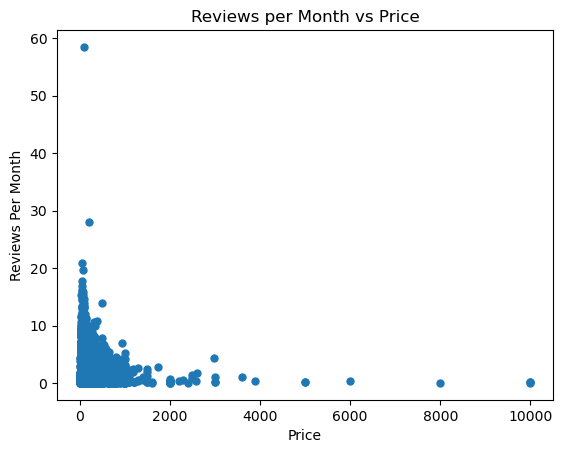

In [8]:
plt.plot(train_df["price"].values, train_df["reviews_per_month"].values, ".", markersize=10)
plt.title('Reviews per Month vs Price')
plt.xlabel("Price")
plt.ylabel("Reviews Per Month");

We can see from the scatterplot that most of the listings that receive a higher number of reviews have a relatively lower price. In fact, the listings with the most reviews reside almost exclusively in the lower price ranges.

### 2. A Scatterplot that plots `reviews_per_month` against `number_of_reviews`

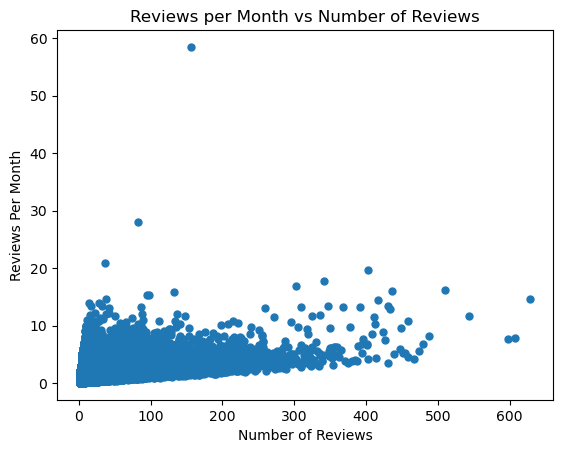

In [9]:
plt.plot(train_df["number_of_reviews"].values, train_df["reviews_per_month"].values, ".", markersize=10)
plt.title('Reviews per Month vs Number of Reviews')
plt.xlabel("Number of Reviews")
plt.ylabel("Reviews Per Month");

We can see that, as expected, the `number_of_reviews` is connected with our target `reviews_per_month`. However, the correlation is not direct in any way - we cannot say that as `number_of_reviews` increases, `reviews_per_month` increases as well. We can only observe that when we look at the scatter plot in the broadest sense, `number_of_reviews` has a slightly positive effect on `reviews_per_month`.

### Some other visualizations that were not really useful...

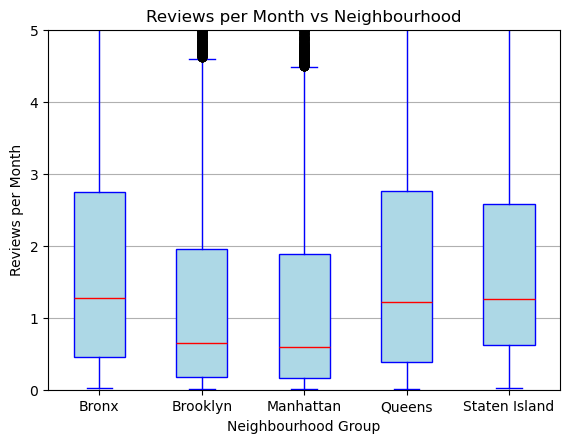

In [10]:
train_df.boxplot(column='reviews_per_month', 
                 by='neighbourhood_group',
                patch_artist=True,  # Fill boxes with color
                boxprops=dict(facecolor='lightblue', color='blue'),
                medianprops=dict(color='red'),
                whiskerprops=dict(color='blue'),
                capprops=dict(color='blue'))
plt.ylim(0, 5)
plt.title('Reviews per Month vs Neighbourhood')
plt.suptitle('')
plt.xlabel('Neighbourhood Group')
plt.ylabel('Reviews per Month')
plt.show()

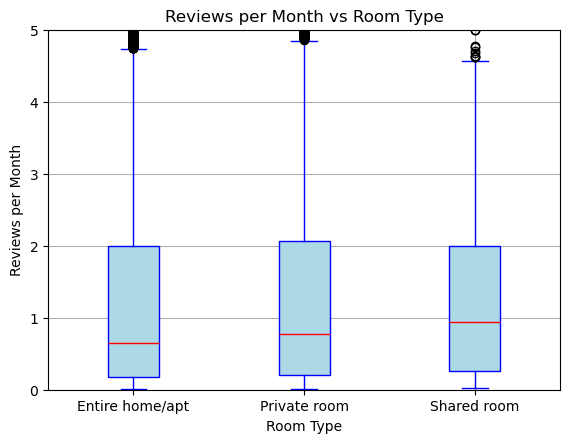

In [11]:
train_df.boxplot(column='reviews_per_month', 
                 by='room_type',
                patch_artist=True,  # Fill boxes with color
                boxprops=dict(facecolor='lightblue', color='blue'),
                medianprops=dict(color='red'),
                whiskerprops=dict(color='blue'),
                capprops=dict(color='blue'))
plt.ylim(0, 5)
plt.title('Reviews per Month vs Room Type')
plt.suptitle('')
plt.xlabel('Room Type')
plt.ylabel('Reviews per Month')
plt.show()

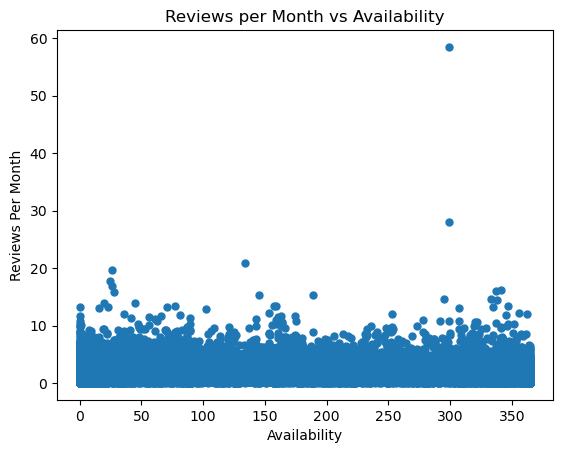

In [12]:
plt.plot(train_df["availability_365"].values, train_df["reviews_per_month"].values, ".", markersize=10)
plt.title('Reviews per Month vs Availability')
plt.xlabel("Availability")
plt.ylabel("Reviews Per Month");

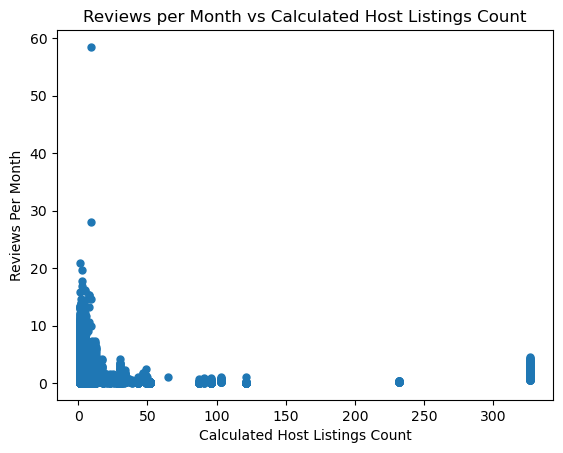

In [13]:
plt.plot(train_df["calculated_host_listings_count"].values, train_df["reviews_per_month"].values, ".", markersize=10)
plt.title('Reviews per Month vs Calculated Host Listings Count')
plt.xlabel("Calculated Host Listings Count")
plt.ylabel("Reviews Per Month");

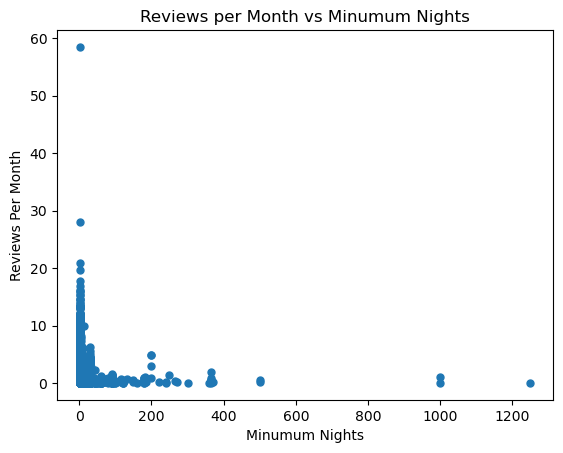

In [14]:
plt.plot(train_df["minimum_nights"].values, train_df["reviews_per_month"].values, ".", markersize=10)
plt.title('Reviews per Month vs Minumum Nights')
plt.xlabel("Minumum Nights")
plt.ylabel("Reviews Per Month");

### Let's look at some summary statistics of the training set

In [15]:
train_df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,3.422600e+04,3.422600e+04,34226.000000,34226.000000,34226.000000,34226.000000,34226.000000,27236.000000,34226.000000,34226.000000
mean,1.893979e+07,6.726273e+07,40.729142,-73.952083,151.528399,7.094957,23.244814,1.369816,7.042453,112.526004
std,1.101332e+07,7.840511e+07,0.054531,0.046201,236.628392,21.548290,44.573323,1.700737,32.590803,131.420031
min,2.539000e+03,2.438000e+03,40.506410,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.394482e+06,7.721897e+06,40.690193,-73.983030,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.954546e+07,3.074526e+07,40.723240,-73.955550,106.000000,3.000000,5.000000,0.710000,1.000000,45.000000
75%,2.915085e+07,1.068375e+08,40.763287,-73.936270,175.000000,5.000000,23.000000,2.000000,2.000000,225.750000
max,3.648561e+07,2.743213e+08,40.912340,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


#### 1. Mean of `reviews_per_month`

In [16]:
train_df['reviews_per_month'].mean()

np.float64(1.3698164194448523)

The mean of our target `reviews_per_month` turns out to be around 1.37. This gives us an overall sense on what the expected value of the feature should be for any given listing.

#### 2. Mean of `price`

In [17]:
train_df['price'].mean()

np.float64(151.528399462397)

Since we have already identified from our first visualization that there is a correlation between `price` and the target `reviews_per_month`, another summary statistic that could be helpful is naturally the mean of the `price` feature. It turns out that the average price of AirBnB in NYC is around $151.5.

### Summary of Initial Observations

There are not many features that could logically be associated with the number of reviews a listing gets. Out of all the features, the ones that could have direct impact on the number of reviews are `number_of_reviews`, `price`, `room_type`, `neighbourhood_group`, `minimum_nights`, and probably `name` for the advertising effect. Aside from the obvious feature `number_of_reviews` being connected to the target, we can also see some other features being potential predictors. Some of these features, like `price`, `room_type`, and `neighbourhood_group`, directly impact the "quality" of the listing to potential customers, and therefore may impact the popularity of the listing, thereby increasing or decreasing the target `reviews_per_month`. Other features like `host_name` and `id` are just identifiers of the listing and do not contribute to the popularity of the listing, so they are unlikely to be significant predictors.

### Metrics for Assessment

Since this is a regression problem, I would choose the **RMSE (Root Mean Square Error)** as the measuring metric. I was deciding between RMSE and MPAE, but eventually settled on the RMSE because the mean of the target `reviews_per_month` is relatively small with a value of 1.37, so it's easy to interpret the RMSE. Furthermore, because the target value is relatively small, I want my model to "punish" large errors, which is what RMSE achieves for me. Finally, MPAE doesn't work well if there are zero values in the dataset as it could cause a potential division-by-zero problem. These are the reasons why I chose RMSE over MPAE as my metric for assessment.

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 4. Feature engineering <a name="4"></a>
<hr>
rubric={points:1}

**Your tasks:**

1. Carry out feature engineering. In other words, extract new features relevant for the problem and work with your new feature set in the following exercises. You may have to go back and forth between feature engineering and preprocessing. 

<div class="alert alert-warning">
    
Solution_4
    
</div>

_Points:_ 1

#### The best features may be dependent on the model you use.
#### Examples:

For counting-based methods like decision trees separate relevant groups of variable values

Discretization makes sense

For distance-based methods like KNN, we want different class labels to be “far”.

Standardization

For regression-based methods like linear regression, we want targets to have a linear dependency on features.



construct a heat map for feature correlations? 

In [18]:
nyc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

### Before we do any data engineering, we see that there are NaN values in our target `reviews_per_month`, let's take a rational approach to eliminating those...

Now, we could use a simple imputer, but that wouldn't really make sense as we cannot just estimate the target for one observation from the target values of other observations. So instead, we will use the fact that if the `number_of_reviews` feature for any observation is 0, then `reviews_per_month` must rationally be 0 as well. Then, if there are more rows left that have NaN target, we will drop them as we have a very large dataset and can afford to do so.

In [19]:
# Impute missing reviews_per_month (0 if number_of_reviews is 0)
nyc_data['reviews_per_month'] = nyc_data.apply(
    lambda row: 0 if pd.isna(row['reviews_per_month']) and row['number_of_reviews'] == 0 else row['reviews_per_month'],
    axis=1
)

# Drop rows where reviews_per_month is still NaN (if any)
nyc_data = nyc_data.dropna(subset=['reviews_per_month'])

In [20]:
nyc_data.shape

(48895, 16)

#### We can see that we still have 48895 observations left, in fact the same number of observations as before! So we didn't lose any observations due to NaN value in the target after this custom imputation.

### Now, let's do some more feature engineering...

#### First, add a feature 'days_since_last_review' that is the number of days of a listing since the last review. If NaN, fill with default value 9999.

I chose to fill the default fill value for `days_since_last_review` as 9999 because I think the feature is going to be negatively correlated with the target `reviews_per_month`, so giving the feature a large value has a good chance of having a desired affect on the prediction.

In [21]:
nyc_data['last_review']

0        2018-10-19
1        2019-05-21
2               NaN
3        2019-07-05
4        2018-11-19
            ...    
48890           NaN
48891           NaN
48892           NaN
48893           NaN
48894           NaN
Name: last_review, Length: 48895, dtype: object

In [22]:
nyc_data['days_since_last_review'] = pd.to_datetime(train_df['last_review'], errors='coerce')
nyc_data['days_since_last_review'] = (pd.to_datetime('2019-12-31') - nyc_data['days_since_last_review']).dt.days
nyc_data['days_since_last_review'] = nyc_data['days_since_last_review'].fillna(9999).astype(int)

### Then, we also want to add a binary feature called `has_review` that is either 1, meaning the listing has a review, or 0, meaning that it does not...

In [23]:
nyc_data['has_reviews'] = nyc_data['number_of_reviews'].apply(lambda x: 1 if x > 0 else 0)

In [24]:
nyc_data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,days_since_last_review,has_reviews
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365,438,1
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355,9999,1
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,0.00,1,365,9999,0
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194,179,1
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0,407,1


### Now that we've done all the feature engineering, re-split the data for the models!

In [25]:
train_df, test_df = train_test_split(nyc_data, test_size = 0.3, random_state=123)
X_train, y_train = train_df.drop(columns=["reviews_per_month"]), pd.DataFrame(train_df["reviews_per_month"])
X_test, y_test = test_df.drop(columns=["reviews_per_month"]), pd.DataFrame(test_df["reviews_per_month"])

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 5. Preprocessing and transformations <a name="5"></a>
<hr>
rubric={points:10}

**Your tasks:**

1. Identify different feature types and the transformations you would apply on each feature type. 
2. Define a column transformer, if necessary. 

<div class="alert alert-warning">
    
Solution_5
    
</div>

_Points:_ 10

Numerical: ['id', 'host_id', 'latitude', 'longitude', 'price', 'minimum_nights', 'calculated_host_listings_count', 'availability_365', 'days_since_last_review']

Text: ['name', 'host_name', 'last_review']

Categorical: ['neighbourhood_group', 'neighbourhood', 'room_type']

Binary: ['has_reviews']

### Let's make some intuitive decisions about the features that we are going to use in our models...

Looking at the features we have now, we can use intuition and domain knowledge about housing popularity to make some decisions about our features. \
For example, I decided to drop the features `id`, `host_id`, `name`, `host_name`, and `calculated_host_listings_count` features because they are unlikely to affect the number of reviews a listing per month. I also dropped `last_review` because we already have an alternate feature engineered from it called `days_since_last_review`. 

In [26]:
numerical_feats = ['latitude', 'longitude', 'price', 'minimum_nights',
                   'availability_365', 'number_of_reviews', 'days_since_last_review']
categorical_feats = ['neighbourhood_group', 'neighbourhood']
ordinal_feats = ['room_type']
drop_feats = ['id', 'host_id', 'name', 'host_name', 'last_review', 'calculated_host_listings_count']
pass_feats = ['has_reviews']

In [27]:
train_df['room_type'].unique()

array(['Entire home/apt', 'Private room', 'Shared room'], dtype=object)

In [28]:
room_types = ['Shared room', 'Private room', 'Entire home/apt']

In [29]:
# numeric transformer with imputation and scaling
numeric_transformer = make_pipeline(SimpleImputer(strategy="median"), StandardScaler())

# one-hot transformer for categorical features
categorical_transformer = make_pipeline(
    SimpleImputer(strategy="constant", fill_value="missing"),
    OneHotEncoder(handle_unknown='ignore'), 
)


# ordinal transformer for ordinal features
ordinal_transformer = make_pipeline(
    SimpleImputer(strategy="constant", fill_value="missing"),
    OrdinalEncoder(categories=[room_types], dtype=int),
)

preprocessor = make_column_transformer(
    ("drop", drop_feats),
    ('passthrough', pass_feats),
    (numeric_transformer, numerical_feats),
    (ordinal_transformer, ordinal_feats),
    (categorical_transformer, categorical_feats)
)

In [30]:
preprocessor

ColumnTransformer(transformers=[('drop', 'drop',
                                 ['id', 'host_id', 'name', 'host_name',
                                  'last_review',
                                  'calculated_host_listings_count']),
                                ('passthrough', 'passthrough', ['has_reviews']),
                                ('pipeline-1',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(strategy='median')),
                                                 ('standardscaler',
                                                  StandardScaler())]),
                                 ['latitude', 'longitude', 'price',
                                  'minimum_nights', 'avai...
                                                                strategy='constant')),
                                                 ('ordinalencoder',
                                                  OrdinalEncoder(categories=[['Shared '
                                                                              'room',
                                                                              'Private '
                                                                              'room',
                                                                              'Entire '
                                                                              'home/apt']],
                                                                 dtype=<class 'int'>))]),
                                 ['room_type']),
                                ('pipeline-3',
                                 Pipeline(steps=[('simpleimputer',
                                                  SimpleImputer(fill_value='missing',
                                                                strategy='constant')),
                                                 ('onehotencoder',
                                                  OneHotEncoder(handle_unknown='ignore'))]),
                                 ['neighbourhood_group', 'neighbourhood'])])

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 6. Baseline model <a name="6"></a>
<hr>
rubric={points:2}

**Your tasks:**
1. Try `scikit-learn`'s baseline model and report results.

<div class="alert alert-warning">
    
Solution_6
    
</div>

_Points:_ 2

In [31]:
X_train.shape

(34226, 17)

In [32]:
X_train.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'calculated_host_listings_count', 'availability_365',
       'days_since_last_review', 'has_reviews'],
      dtype='object')

In [33]:
# Construct baseline regression - DummyRegressor()

pipe_dummy = make_pipeline(preprocessor, DummyRegressor())
dummy_scores = pd.DataFrame(cross_validate(pipe_dummy, X_train, y_train, return_train_score = True, scoring='neg_mean_squared_error'))

dummy_scores['train_score'] = np.sqrt(-dummy_scores['train_score'])
dummy_scores['test_score'] = np.sqrt(-dummy_scores['test_score'])

dummy_scores

,fit_time,score_time,test_score,train_score
0,0.063242,0.014590,1.606253,1.616566
1,0.051315,0.014151,1.610708,1.615458
2,0.052106,0.013151,1.704226,1.591290
3,0.050073,0.013925,1.565892,1.626435
4,0.049901,0.013927,1.581946,1.622553


In [34]:
...

Ellipsis

In [35]:
...

Ellipsis

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 7. Linear models <a name="7"></a>
<hr>
rubric={points:10}

**Your tasks:**

1. Try a linear model as a first real attempt. 
2. Carry out hyperparameter tuning to explore different values for the complexity hyperparameter. 
3. Report cross-validation scores along with standard deviation. 
4. Summarize your results.

<div class="alert alert-warning">
    
Solution_7
    
</div>

_Points:_ 10

_Type your answer here, replacing this text._

### We will use Ridge, which has hyperparameter `alpha`, let's use RandomizedSearch !

In [36]:
pipe_ridge = make_pipeline(preprocessor, Ridge())
pipe_ridge

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('drop', 'drop',
                                                  ['id', 'host_id', 'name',
                                                   'host_name', 'last_review',
                                                   'calculated_host_listings_count']),
                                                 ('passthrough', 'passthrough',
                                                  ['has_reviews']),
                                                 ('pipeline-1',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['latitude', 'long...
                                                                  ('ordinalencoder',
                                                                   OrdinalEncoder(categories=[['Shared '
                                                                                               'room',
                                                                                               'Private '
                                                                                               'room',
                                                                                               'Entire '
                                                                                               'home/apt']],
                                                                                  dtype=<class 'int'>))]),
                                                  ['room_type']),
                                                 ('pipeline-3',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(fill_value='missing',
                                                                                 strategy='constant')),
                                                                  ('onehotencoder',
                                                                   OneHotEncoder(handle_unknown='ignore'))]),
                                                  ['neighbourhood_group',
                                                   'neighbourhood'])])),
                ('ridge', Ridge())])

In [37]:
param_grid = {
    "ridge__alpha": 10.0 ** np.arange(-20, 10),
}
print("Grid size: %d" % (np.prod(list(map(len, param_grid.values())))))
param_grid

Grid size: 30


{'ridge__alpha': array([1.e-20, 1.e-19, 1.e-18, 1.e-17, 1.e-16, 1.e-15, 1.e-14, 1.e-13,
        1.e-12, 1.e-11, 1.e-10, 1.e-09, 1.e-08, 1.e-07, 1.e-06, 1.e-05,
        1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03,
        1.e+04, 1.e+05, 1.e+06, 1.e+07, 1.e+08, 1.e+09])}

In [38]:
random_search = RandomizedSearchCV(
    pipe_ridge, param_distributions=param_grid, n_jobs=-1, n_iter=30, cv=5, random_state=123
)

random_search.fit(X_train, y_train);

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


#### Best score of Ridge attained by Random Search

In [39]:
random_search.best_score_

np.float64(0.4822609793456915)

#### Best hyperparameter `alpha` of Ridge attained by Random Search

In [40]:
best_alpha = random_search.best_params_['ridge__alpha']
best_alpha

np.float64(1.0)

In [41]:
pipe_ridge_best = make_pipeline(preprocessor, Ridge(best_alpha))

In [42]:
ridge_scores = pd.DataFrame(cross_validate(pipe_ridge_best, X_train, y_train, return_train_score=True, scoring='neg_mean_squared_error'))
ridge_scores['train_score'] = np.sqrt(-ridge_scores['train_score'])
ridge_scores['test_score'] = np.sqrt(-ridge_scores['test_score'])

ridge_scores

,fit_time,score_time,test_score,train_score
0,0.244717,0.016573,1.130636,1.161696
1,0.171763,0.016056,1.143389,1.158594
2,0.175925,0.014998,1.307189,1.114764
3,0.178059,0.015926,1.102411,1.168626
4,0.180172,0.015799,1.124436,1.163000


#### Standard Deviations of Training and Validation Scores

In [43]:
# Training
np.std(ridge_scores['train_score'])

np.float64(0.01955772631879962)

In [44]:
# Validation
np.std(ridge_scores['test_score'])

np.float64(0.07398790685118514)

#### Mean Validation Scores

In [45]:
# mean of Validation Score
print(f'Ridge Mean Validation Score: {np.mean(ridge_scores['test_score'])}')

Ridge Mean Validation Score: 1.1616120223583408


In [46]:
print(f'Ridge Mean Fit Time: {np.mean(ridge_scores['fit_time'])}')

Ridge Mean Fit Time: 0.19012722969055176


In [47]:
print(f'Ridge Mean Score Time: {np.mean(ridge_scores['score_time'])}')

Ridge Mean Score Time: 0.01587047576904297


### Summary of Results from Linear Model

#### Standard Deviation of Target

In [48]:
np.std(y_train.squeeze())

/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:4109: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


reviews_per_month    1.614508
dtype: float64

By using the Ridge regressor with the chosen hyperparameter of `alpha = 10`, we were able to attain a mean validation score (RMSE) of 1.16, meaning that our model's predictions are average about 1.16 off the actual value.

When we look at our target variable `reviews_per_month`, we can see that its standard deviation is 1.61, which is larger than our model's average RMSE. This is a good sign as a RMSE smaller than the standard deviation of the target indicates that our model is performing relatively well.Therefore, this is a good starting point as it acts as an actual baseline that we can compare our more complex models to. The standard deviation of the validation score is around 0.073, which is acceptable and means that there isn't much variability between the RMSE produced among the different folds in cross-validation. As far as we are concerned, a simple linear model is not going to be enough to get a completely satisfactory result on this complex regression problem we are dealing with, so we've already achieved our goal of having an initial model by constructing the Ridge regressor.

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 8. Different models <a name="8"></a>
<hr>
rubric={points:12}

**Your tasks:**
1. Try at least 3 other models aside from a linear model. One of these models should be a tree-based ensemble model. 
2. Summarize your results in terms of overfitting/underfitting and fit and score times. Can you beat a linear model? 

<div class="alert alert-warning">
    
Solution_8
    
</div>

_Points:_ 12

_Type your answer here, replacing this text._

### 1. RandomForestRegressor

In [49]:
# RandomForestRegressor
pipe_rf = make_pipeline(
    preprocessor,
    RandomForestRegressor(
        n_jobs=-1,
        random_state=123,
    ),
)

rf_scores = pd.DataFrame(cross_validate(pipe_rf, X_train, y_train.squeeze(), return_train_score=True, scoring='neg_mean_squared_error'))
rf_scores['train_score'] = np.sqrt(-rf_scores['train_score'])
rf_scores['test_score'] = np.sqrt(-rf_scores['test_score'])

rf_scores

,fit_time,score_time,test_score,train_score
0,17.540253,0.053247,0.883995,0.338016
1,17.268231,0.055664,0.875198,0.342963
2,17.349513,0.054620,1.006848,0.324765
3,17.364772,0.054323,0.835182,0.345618
4,17.218421,0.055105,0.878417,0.341731


In [50]:
print(f'Random Forest Mean Train Score: {np.mean(rf_scores['train_score'])}')

Random Forest Mean Train Score: 0.3386186817655023


In [51]:
print(f'Random Forest Mean Validation Score: {np.mean(rf_scores['test_score'])}')

Random Forest Mean Validation Score: 0.8959279326686845


In [52]:
print(f'Random Forest Mean Fit Time: {np.mean(rf_scores['fit_time'])}')

Random Forest Mean Fit Time: 17.348237895965575


In [53]:
print(f'Random Forest Mean Score Time: {np.mean(rf_scores['score_time'])}')

Random Forest Mean Score Time: 0.05459184646606445


### 2. XGBoost

In [54]:
from xgboost import XGBRegressor

In [55]:
pipe_xgb = make_pipeline(
    preprocessor,
    XGBRegressor(
        random_state=123, verbosity=0
    )
)

xgb_scores = pd.DataFrame(cross_validate(pipe_xgb, X_train, y_train.squeeze(), return_train_score=True, scoring='neg_mean_squared_error'))
xgb_scores['train_score'] = np.sqrt(-xgb_scores['train_score'])
xgb_scores['test_score'] = np.sqrt(-xgb_scores['test_score'])

xgb_scores

,fit_time,score_time,test_score,train_score
0,0.636388,0.026186,0.913902,0.647772
1,0.455331,0.022642,0.871826,0.655813
2,0.384922,0.022768,1.005172,0.653473
3,0.374165,0.025950,0.840504,0.652365
4,0.378151,0.023656,0.876902,0.647826


In [56]:
print(f'XGBoost Mean Train Score: {np.mean(xgb_scores['train_score'])}')

XGBoost Mean Train Score: 0.6514498858050011


In [57]:
print(f'XGBoost Mean Validation Score: {np.mean(xgb_scores['test_score'])}')

XGBoost Mean Validation Score: 0.9016611742532431


In [58]:
print(f'XGBoost Mean Fit Time: {np.mean(xgb_scores['fit_time'])}')

XGBoost Mean Fit Time: 0.44579143524169923


In [59]:
print(f'XGBoost Mean Score Time: {np.mean(xgb_scores['score_time'])}')

XGBoost Mean Score Time: 0.024240398406982423


### 3. LightGBM

In [60]:
from lightgbm.sklearn import LGBMRegressor

In [61]:
pipe_lgbm = make_pipeline(
    preprocessor,
    LGBMRegressor(
        random_state=123, verbosity=-1
    )
)

lgbm_scores = pd.DataFrame(cross_validate(pipe_lgbm, X_train, y_train.squeeze(), return_train_score=True, scoring='neg_mean_squared_error'))
lgbm_scores['train_score'] = np.sqrt(-lgbm_scores['train_score'])
lgbm_scores['test_score'] = np.sqrt(-lgbm_scores['test_score'])

lgbm_scores

/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted w

,fit_time,score_time,test_score,train_score
0,0.363627,0.032318,0.854514,0.754554
1,0.425981,0.028093,0.852376,0.759753
2,0.510896,0.024726,1.017692,0.728375
3,0.438514,0.026850,0.826724,0.755930
4,0.601569,0.028058,0.876749,0.750659


In [62]:
print(f'LGBM Mean Train Score: {np.mean(lgbm_scores['train_score'])}')

LGBM Mean Train Score: 0.7498541035700214


In [63]:
print(f'LGBM Mean Validation Score: {np.mean(lgbm_scores['test_score'])}')

LGBM Mean Validation Score: 0.8856110141474437


In [64]:
print(f'LGBM Mean Fit Time: {np.mean(lgbm_scores['fit_time'])}')

LGBM Mean Fit Time: 0.46811738014221194


In [65]:
print(f'LGBM Mean Score Time: {np.mean(lgbm_scores['score_time'])}')

LGBM Mean Score Time: 0.02800898551940918


### 4. Average: VotingClassifier with the RandomForestRegressor, XGBoost, and LightGBM models constructed in #1 and #2 and #3

In [66]:
from sklearn.ensemble import VotingRegressor

In [67]:
# Base Models
rf = RandomForestRegressor(
        n_jobs=-1,
        random_state=123,
    )

xgb = XGBRegressor(
        random_state=123, verbosity=0
    )

lgbm = LGBMRegressor(
        random_state=123, verbosity=-1
    )

avg_reg = VotingRegressor(estimators=[('rf', rf), ('xgb', xgb), ('lgbm', lgbm)])

pipe_avg = make_pipeline(
    preprocessor, avg_reg
)

In [68]:
avg_scores = pd.DataFrame(cross_validate(pipe_avg, X_train, y_train.squeeze(), return_train_score=True, scoring='neg_mean_squared_error'))
avg_scores['train_score'] = np.sqrt(-avg_scores['train_score'])
avg_scores['test_score'] = np.sqrt(-avg_scores['test_score'])

avg_scores

/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted w

,fit_time,score_time,test_score,train_score
0,19.129625,0.080653,0.858867,0.560441
1,18.508461,0.076588,0.842002,0.565872
2,19.038183,0.105687,0.994293,0.553995
3,17.887519,0.076232,0.817622,0.563761
4,18.165715,0.076838,0.862026,0.559761


In [69]:
print(f'Averaging Mean Train Score: {np.mean(avg_scores['train_score'])}')

Averaging Mean Train Score: 0.5607659902422787


In [70]:
print(f'Averaging Mean Validation Score: {np.mean(avg_scores['test_score'])}')

Averaging Mean Validation Score: 0.8749620457650161


In [71]:
print(f'Averaging Mean Fit Time: {np.mean(avg_scores['fit_time'])}')

Averaging Mean Fit Time: 18.54590063095093


In [72]:
print(f'Averaging Mean Score Time: {np.mean(avg_scores['score_time'])}')

Averaging Mean Score Time: 0.08319954872131348


### Summary of Results

#### Standard Deviation of Target

In [73]:
np.std(y_train.squeeze())

/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/numpy/_core/fromnumeric.py:4109: FutureWarning: The behavior of DataFrame.std with axis=None is deprecated, in a future version this will reduce over both axes and return a scalar. To retain the old behavior, pass axis=0 (or do not pass axis)
  return std(axis=axis, dtype=dtype, out=out, ddof=ddof, **kwargs)


reviews_per_month    1.614508
dtype: float64

We experimented with a total of four different types of models: RandomForestRegressor, XGBRegressor, LGBMRegressor, and finally an average ensemble with the three of them as base models. (side note: I did try to use StackingRegressor with the three base models, but chose not to include it as the training process took too long on my machine...)

### In terms of RMSE score:
**We are using RMSE as our metric, so the score mentioned below can be interpreted as the average number of reviews per month that our predicted values are off by compared to the actual values.**

The Random Forest regressor produced a mean training RMSE of 0.34, but has a mean validation RMSE of 0.90. Both scores are lower than the standard deviation of the target variable, which indicates that the model is performing well. However, there is a considerable gap of 0.56 between the training and validation RMSE scores, so there is a possibility that the model is overfitting.

The XGBoost regressor produced a mean training RMSE of 0.65 but a mean validation RMSE of 0.90. Both scores are lower than the standard deviation of the target variable, which indicates that the model is performing well. There is a gap between the training and validation RMSE scores of 0.25, which is less than that of the Random Forest regressor but is still significant, so the XGBoost regressor is potentially mildly overfitting.

The LightBGM regressor produced a mean training RMSE of 0.75 and a mean validation RMSE of 0.89. The gap between the training and validation scores is only 0.14, even less than that of the XGBoost regressor, so I would say that the LightBGM regressor is NOT overfitting and generalizes well.

The Voting average regressor with the three base models produced a mean training RMSE of 0.56 but only a mean validation RMSE of 0.87. The gap between the training and validation RMSE is 0.31, which is not significant either and indicates that the Voting average regressor is NOT overfitting.

**All three base models of Random Forest, XGBoost, and LightGBM performed way better than the linear Ridge model**. With validation RMSE of below 0.9, they are magnitudes better than Ridge's RMSE of 1.16. The best RMSE score was produced when we combined the three models with a **VotingRegressor, which produced the best RMSE of only 0.87.**

### In terms of Fit / Score time

The Ridge regressor had mean fit time of 0.19 and mean score time of 0.014.

**Four non-linear models:**
1. The Random Forest regressor had mean fit time of 15.9 and mean score time of 0.053.
2. The XGBoost regressor had mean fit time of 0.28 and mean score time of 0.020.
3. The LightGBM regressor had mean fit time of 0.45 and mean score time of 0.026.
4. The Voting average regressor had mean fit time of 16.3 and mean score time of 0.075.

#### Fit Time
We can see that the Random Forest regressor has really long fit time of 15.9 seconds, causing the Voting average regressor to also have a long fit time of 16.3 seconds. On the other hand, the XGBoost regressor had a mean fit time of 0.28 seconds and the LightGBM regressor had a mean fit time of 0.45, both closer to the Ridge regressor, which had the fastest mean fit time of 0.19 seconds. 


#### Score Time
Even though the score times differ between the models, they are all under 0.1 seconds, so it is reasonable to consider the differences to be insignificant.

Overall, the running time of the XGBoost regressor is the fastest among the non-linear models, but it is still not as fast as the Ridge regressor. **The Ridge regressor wins in terms of fit / score time.**

### Overall, 

**I would pick one of the non-linear regressors over the linear Ridge regressor, because even though the Ridge regressor has faster fit / score time, the significantly better RMSE score of the non-linear models overweights the slightly difference in running time between the Ridge model than, let's say, the XGBoost regressor.**

**If we want the best of both worlds, where speed and score both matters and we need a balance between the two, I would use the XGBoost regressor, because it has the best running time among the non-linear models while still achieving a way better RMSE score than the linear Ridge regressor.**

**However, if we need speed and don't care about the RMSE score as much, Ridge might be the right option. By the same reason, if we want to prioritize the score, then I would use the VotingRegressor because it produces the best RMSE score.**

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 9. Feature selection <a name="9"></a>
<hr>
rubric={points:2}

**Your tasks:**

Make some attempts to select relevant features. You may try `RFECV` or forward selection for this. Do the results improve with feature selection? Summarize your results. If you see improvements in the results, keep feature selection in your pipeline. If not, you may abandon it in the next exercises. 

<div class="alert alert-warning">
    
Solution_9
    
</div>

_Points:_ 2

#### We are going to try feature selection with the XGBoost Regressor as the model, since we identified it in the last section as the one that balances fast fit / score time with good RMSE score.

In [74]:
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV
from sklearn.linear_model import LogisticRegression

rfecv = RFECV(
    estimator=xgb,
    step=1,
    cv=3,
    scoring='neg_mean_squared_error'
)

rfe_cv_pipe = make_pipeline(
    preprocessor, 
    rfecv,
    xgb
)

rfe_cv_pipe.fit(X_train, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('drop', 'drop',
                                                  ['id', 'host_id', 'name',
                                                   'host_name', 'last_review',
                                                   'calculated_host_listings_count']),
                                                 ('passthrough', 'passthrough',
                                                  ['has_reviews']),
                                                 ('pipeline-1',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['latitude', 'long...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=123, ...))])

In [75]:
# Get transformed feature names - categorical (one-hot) and ordinal
ordinal_encoder = rfe_cv_pipe.named_steps["columntransformer"].named_transformers_["pipeline-2"]
ordinal_features = ordinal_encoder.get_feature_names_out()

one_hot_encoder = rfe_cv_pipe.named_steps["columntransformer"].named_transformers_["pipeline-3"]
categorical_features = one_hot_encoder.get_feature_names_out()


# Get all feature names (passthrough + numerical + ordinal + categorical (one-hot)) -> ORDER MATTERS!
all_feature_names = pass_feats + numerical_feats + list(ordinal_features) + list(categorical_features)

# Get selected feature names based on RFECV
selected_features = [name for name, selected in zip(all_feature_names, rfecv.support_) if selected]
print("Selected Features:", selected_features)

Selected Features: ['latitude', 'longitude', 'price', 'minimum_nights', 'availability_365', 'number_of_reviews', 'days_since_last_review', 'room_type', 'neighbourhood_group_Bronx', 'neighbourhood_group_Brooklyn', 'neighbourhood_group_Manhattan', 'neighbourhood_Arverne', 'neighbourhood_Astoria', 'neighbourhood_Bay Ridge', 'neighbourhood_Bedford-Stuyvesant', 'neighbourhood_Belmont', 'neighbourhood_Bensonhurst', 'neighbourhood_Bushwick', 'neighbourhood_Cambria Heights', 'neighbourhood_Canarsie', 'neighbourhood_Carroll Gardens', 'neighbourhood_Civic Center', 'neighbourhood_Clason Point', 'neighbourhood_Clifton', 'neighbourhood_Columbia St', 'neighbourhood_Corona', 'neighbourhood_Crown Heights', 'neighbourhood_East Elmhurst', 'neighbourhood_East Flatbush', 'neighbourhood_East Harlem', 'neighbourhood_East Village', 'neighbourhood_Fieldston', 'neighbourhood_Financial District', 'neighbourhood_Flushing', 'neighbourhood_Fort Greene', 'neighbourhood_Fresh Meadows', 'neighbourhood_Gowanus', 'neig

### Interpretation of RFECV Results

Since we used OneHotEncoder and OrdinalEncoder in our preprocessor, we get lots of features back, with each selected individual categories in the categorical features as features, along with, of course, the selected numerical features. We can see that the features that were selected by the recursive feature elimination method are: `latitude`, `longitude`, `price`, `minimum_nights`, `availability_365`, `number_of_reviews`, `days_since_last_review`, `room_type`, `neighbourhood_group`, and `neighbourhood`.

Let's try training a XGBoost regressor with these selected features to see if the score is improved!

In [76]:
selected_features = ['latitude', 'longitude', 'price', 'minimum_nights', 'availability_365', 'number_of_reviews', 
                     'days_since_last_review', 'room_type', 'neighbourhood_group', 'neighbourhood']
X_train_selected = X_train[selected_features]
X_train_selected.head()

,latitude,longitude,price,minimum_nights,availability_365,number_of_reviews,days_since_last_review,room_type,neighbourhood_group,neighbourhood
36150,40.83256,-73.94440,96,4,17,0,9999,Entire home/apt,Manhattan,Washington Heights
45223,40.76134,-73.99299,150,30,332,0,9999,Entire home/apt,Manhattan,Hell's Kitchen
14316,40.71119,-73.95097,200,1,0,0,9999,Private room,Brooklyn,Williamsburg
1691,40.75900,-73.99530,95,1,0,0,9999,Entire home/apt,Manhattan,Hell's Kitchen
20195,40.71306,-73.94856,199,3,0,1,1115,Entire home/apt,Brooklyn,Williamsburg


In [77]:
cat_selected_feats = ['neighbourhood', 'neighbourhood_group']
ordinal_selected_feats = ['room_type']
numeric_selected_feats = ['latitude', 'longitude', 'price', 'minimum_nights', 'availability_365', 'number_of_reviews', 
                     'days_since_last_review']

preprocessor_selected = make_column_transformer(
    (numeric_transformer, numeric_selected_feats),
    (ordinal_transformer, ordinal_selected_feats),
    (categorical_transformer, cat_selected_feats)
)

selected_xgb_pipe = make_pipeline(
    preprocessor_selected,
    XGBRegressor(random_state=123, verbosity=0)
)
selected_xgb_pipe

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['latitude', 'longitude',
                                                   'price', 'minimum_nights',
                                                   'availability_365',
                                                   'number_of_reviews',
                                                   'days_since_last_review']),
                                                 ('pipeline-2',
                                                  Pipeline(steps=[('simpleimputer',...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=None,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=None, n_jobs=None,
                              num_parallel_tree=None, random_state=123, ...))])

### Let's perform cross validation to see how XGBoost Regressor does with the selected features!

In [78]:
selected_xgb_scores = pd.DataFrame(cross_validate(selected_xgb_pipe, X_train_selected, y_train, return_train_score = True, scoring='neg_mean_squared_error'))
selected_xgb_scores['train_score'] = np.sqrt(-selected_xgb_scores['train_score'])
selected_xgb_scores['test_score'] = np.sqrt(-selected_xgb_scores['test_score'])

selected_xgb_scores

,fit_time,score_time,test_score,train_score
0,0.298044,0.022075,0.913553,0.647772
1,0.269585,0.022277,0.871769,0.655813
2,0.275077,0.020913,1.005158,0.653473
3,0.295012,0.022353,0.840461,0.652365
4,0.285105,0.021659,0.876411,0.647826


In [79]:
# original XGBoost Regressor that uses all the features
xgb_scores

,fit_time,score_time,test_score,train_score
0,0.636388,0.026186,0.913902,0.647772
1,0.455331,0.022642,0.871826,0.655813
2,0.384922,0.022768,1.005172,0.653473
3,0.374165,0.025950,0.840504,0.652365
4,0.378151,0.023656,0.876902,0.647826


### Compare new results against the original XGBoost Regressor with all the features from the last section...

In [80]:
print(f'Selected XGB Mean Validation Score: {np.mean(selected_xgb_scores['test_score'])}')

Selected XGB Mean Validation Score: 0.9014703748437759


In [81]:
print(f'Selected XGB Mean Fit Time: {np.mean(selected_xgb_scores['fit_time'])}')

Selected XGB Mean Fit Time: 0.28456454277038573


In [82]:
print(f'Original XGB Mean Validation Score: {np.mean(xgb_scores['test_score'])}')

Original XGB Mean Validation Score: 0.9016611742532431


In [83]:
print(f'Original XGB Mean Fit Time: {np.mean(xgb_scores['fit_time'])}')

Original XGB Mean Fit Time: 0.44579143524169923


**The version that uses the selected features does have a slightly better RMSE score and a slighly faster fit time, but the difference is not significant by any means. However, since the model is able to reproduce the same results with less features, it means that the selected features are indeed the essential features that are the most predictive of our target `reviews_per_month`. Therefore, I am going to keep using the selected features as my feature space from now on.**

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 10. Hyperparameter optimization <a name="10"></a>
<hr>
rubric={points:10}

**Your tasks:**

Make some attempts to optimize hyperparameters for the models you've tried and summarize your results. In at least one case you should be optimizing multiple hyperparameters for a single model. You may use `sklearn`'s methods for hyperparameter optimization or fancier Bayesian optimization methods. 
  - [GridSearchCV](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html)   
  - [RandomizedSearchCV](http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.RandomizedSearchCV.html)
  - [scikit-optimize](https://github.com/scikit-optimize/scikit-optimize) 

<div class="alert alert-warning">
    
Solution_10
    
</div>

_Points:_ 10

### We choose to use RandomSearchCV to optimize hyperparameters because it is faster compared to GridSearchCV. Furthermore, it works better when some parameters are more important than others.

#### We tried to optimize the hyperparameters of RandomForestRegressor, but the task was taking too long for my machine, so I just used the default hyperparameters for RandomForestRegressor in the VotingRegressor...

In [84]:
# # Random Forest Regressor

# rf_param_dist = {'randomforestregressor__n_estimators': [100, 200, 300, 500],
#                 'randomforestregressor__max_depth': [None, 10, 20, 30, 40]}

# pipe_rf_selected = make_pipeline(
#     preprocessor_selected,
#     rf
# )

# rf_random_search = RandomizedSearchCV(estimator=pipe_rf_selected,
#                                    param_distributions=rf_param_dist,
#                                    n_iter=15,  # Number of different combinations to try
#                                    cv=2,  # Cross-validation
#                                    verbose=0,  # Print progress
#                                    random_state=123,
#                                    n_jobs=-1,  # Use all available cores
#                                    scoring='neg_mean_squared_error') 

# rf_random_search.fit(X_train_selected, y_train.squeeze())

In [85]:
# print("Optimized Random Forest Best Scores:", np.sqrt(-rf_random_search.best_score_))

In [86]:
# rf_best_params = rf_random_search.best_params_
# print("Optimized Random Forest Best Hyperparameters:", rf_best_params)

In [87]:
# XGBoost Regressor

xgb_param_dist = {'xgbregressor__n_estimators': [100, 200, 300, 500],
                  'xgbregressor__learning_rate': [0.01, 0.1, 0.3, 0.5, 1],
                'xgbregressor__max_depth': [None, 10, 20, 30, 40]}

pipe_xgb_selected = make_pipeline(
    preprocessor_selected,
    xgb
)

xgb_random_search = RandomizedSearchCV(estimator=pipe_xgb_selected,
                                   param_distributions=xgb_param_dist,
                                   n_iter=15,  # Number of different combinations to try
                                   cv=5,  # Cross-validation
                                   verbose=0,  # Print progress
                                   random_state=123,
                                   n_jobs=-1,  # Use all available cores
                                   scoring='neg_mean_squared_error') 

xgb_random_search.fit(X_train_selected, y_train.squeeze())

Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.
Intel MKL WARNING: Support of Intel(R) Streaming SIMD Extensions 4.2 (Intel(R) SSE4.2) enabled only processors has been deprecated. Intel oneAPI Math Kernel Library 2025.0 will require Intel(R) Advanced Vector Extensions (Intel(R) AVX) instructions.


RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('columntransformer',
                                              ColumnTransformer(transformers=[('pipeline-1',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('standardscaler',
                                                                                                StandardScaler())]),
                                                                               ['latitude',
                                                                                'longitude',
                                                                                'price',
                                                                                'minimum_nights',
                                                                                'availability_365',
                                                                                'number_of_reviews',
                                                                                'days_since_last_review']),
                                                                              ('pipeline-2'...
                                                           monotone_constraints=None,
                                                           multi_strategy=None,
                                                           n_estimators=None,
                                                           n_jobs=None,
                                                           num_parallel_tree=None,
                                                           random_state=123, ...))]),
                   n_iter=15, n_jobs=-1,
                   param_distributions={'xgbregressor__learning_rate': [0.01,
                                                                        0.1,
                                                                        0.3,
                                                                        0.5,
                                                                        1],
                                        'xgbregressor__max_depth': [None, 10,
                                                                    20, 30,
                                                                    40],
                                        'xgbregressor__n_estimators': [100, 200,
                                                                       300,
                                                                       500]},
                   random_state=123, scoring='neg_mean_squared_error')

In [88]:
print("Optimized XGBoost Regressor Best Scores:", np.sqrt(-xgb_random_search.best_score_))

Optimized XGBoost Regressor Best Scores: 0.8981868975923918


In [89]:
xgb_best_params = xgb_random_search.best_params_
print("Optimized XGBoost Regressor Best Hyperparameters:", xgb_best_params)

Optimized XGBoost Regressor Best Hyperparameters: {'xgbregressor__n_estimators': 500, 'xgbregressor__max_depth': None, 'xgbregressor__learning_rate': 0.1}


In [90]:
# LightGBM Regressor

lgbm_param_dist = {'lgbmregressor__n_estimators': [100, 200, 300, 500],
                  'lgbmregressor__learning_rate': [0.01, 0.1, 0.3, 0.5, 1],
                'lgbmregressor__max_depth': [None, 10, 20, 30, 40]}

pipe_lgbm_selected = make_pipeline(
    preprocessor_selected,
    lgbm
)

lgbm_random_search = RandomizedSearchCV(estimator=pipe_lgbm_selected,
                                   param_distributions=lgbm_param_dist,
                                   n_iter=15,  # Number of different combinations to try
                                   cv=5,  # Cross-validation
                                   verbose=0,  # Print progress
                                   random_state=123,
                                   n_jobs=-1,  # Use all available cores
                                   scoring='neg_mean_squared_error') 

lgbm_random_search.fit(X_train_selected, y_train.squeeze())

/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted w

RandomizedSearchCV(cv=5,
                   estimator=Pipeline(steps=[('columntransformer',
                                              ColumnTransformer(transformers=[('pipeline-1',
                                                                               Pipeline(steps=[('simpleimputer',
                                                                                                SimpleImputer(strategy='median')),
                                                                                               ('standardscaler',
                                                                                                StandardScaler())]),
                                                                               ['latitude',
                                                                                'longitude',
                                                                                'price',
                                                                                'minimum_nights',
                                                                                'availability_365',
                                                                                'number_of_reviews',
                                                                                'days_since_last_review']),
                                                                              ('pipeline-2'...
                                                                                                OneHotEncoder(handle_unknown='ignore'))]),
                                                                               ['neighbourhood',
                                                                                'neighbourhood_group'])])),
                                             ('lgbmregressor',
                                              LGBMRegressor(random_state=123,
                                                            verbosity=-1))]),
                   n_iter=15, n_jobs=-1,
                   param_distributions={'lgbmregressor__learning_rate': [0.01,
                                                                         0.1,
                                                                         0.3,
                                                                         0.5,
                                                                         1],
                                        'lgbmregressor__max_depth': [None, 10,
                                                                     20, 30,
                                                                     40],
                                        'lgbmregressor__n_estimators': [100,
                                                                        200,
                                                                        300,
                                                                        500]},
                   random_state=123, scoring='neg_mean_squared_error')

In [91]:
print("Optimized LightGBM Regressor Best Scores:", np.sqrt(-lgbm_random_search.best_score_))

Optimized LightGBM Regressor Best Scores: 0.8856900370410666


In [92]:
lgbm_best_params = lgbm_random_search.best_params_
print("Optimized LightGBM Regressor Best Hyperparameters:", lgbm_best_params)

Optimized LightGBM Regressor Best Hyperparameters: {'lgbmregressor__n_estimators': 100, 'lgbmregressor__max_depth': 10, 'lgbmregressor__learning_rate': 0.1}


### Finally, we use the optimized versions of XGBoost Regressor and LightGBM Regressors to make a VotingRegressor!

In [93]:
print("Optimized XGBoost Regressor Best Hyperparameters:", xgb_best_params)

Optimized XGBoost Regressor Best Hyperparameters: {'xgbregressor__n_estimators': 500, 'xgbregressor__max_depth': None, 'xgbregressor__learning_rate': 0.1}


In [94]:
print("Optimized LightGBM Regressor Best Hyperparameters:", lgbm_best_params)

Optimized LightGBM Regressor Best Hyperparameters: {'lgbmregressor__n_estimators': 100, 'lgbmregressor__max_depth': 10, 'lgbmregressor__learning_rate': 0.1}


In [95]:
# VotingRegressor with the optimized base models

optimized_avg = VotingRegressor(estimators = [
    ('rf', RandomForestRegressor()),
    ('xgb', XGBRegressor(n_estimators=500, max_depth=None, learning_rate=0.1)), 
    ('lgbm', LGBMRegressor(n_estimators=100, max_depth=10, learning_rate=0.1))
])


optimized_avg_pipe = make_pipeline(
    preprocessor_selected,
    optimized_avg
)

optimized_avg_pipe

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['latitude', 'longitude',
                                                   'price', 'minimum_nights',
                                                   'availability_365',
                                                   'number_of_reviews',
                                                   'days_since_last_review']),
                                                 ('pipeline-2',
                                                  Pipeline(steps=[('simpleimputer',...
                                                           interaction_constraints=None,
                                                           learning_rate=0.1,
                                                           max_bin=None,
                                                           max_cat_threshold=None,
                                                           max_cat_to_onehot=None,
                                                           max_delta_step=None,
                                                           max_depth=None,
                                                           max_leaves=None,
                                                           min_child_weight=None,
                                                           missing=nan,
                                                           monotone_constraints=None,
                                                           multi_strategy=None,
                                                           n_estimators=500,
                                                           n_jobs=None,
                                                           num_parallel_tree=None,
                                                           random_state=None, ...)),
                                             ('lgbm',
                                              LGBMRegressor(max_depth=10))]))])

### Let's see how this hyperparameter-optimized version of VotingRegressor perform with cross validation...

In [96]:
optimized_avg_scores = pd.DataFrame(cross_validate(optimized_avg_pipe, X_train_selected, y_train.squeeze(), return_train_score=True, scoring='neg_mean_squared_error'))

optimized_avg_scores['train_score'] = np.sqrt(-optimized_avg_scores['train_score'])
optimized_avg_scores['test_score'] = np.sqrt(-optimized_avg_scores['test_score'])

optimized_avg_scores

/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/opt/miniconda3/envs/cpsc330/lib/python3.12/site-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted w

,fit_time,score_time,test_score,train_score
0,91.099408,0.177863,0.851971,0.547052
1,95.683399,0.241558,0.847440,0.555509
2,90.411305,0.190519,0.989839,0.544009
3,89.938282,0.172346,0.814179,0.557293
4,91.344363,0.187929,0.857872,0.546112


In [97]:
print(f'Optimized Averaging Mean Validation Score: {np.mean(optimized_avg_scores['test_score'])}')

Optimized Averaging Mean Validation Score: 0.8722601811544987


In [98]:
avg_scores

,fit_time,score_time,test_score,train_score
0,19.129625,0.080653,0.858867,0.560441
1,18.508461,0.076588,0.842002,0.565872
2,19.038183,0.105687,0.994293,0.553995
3,17.887519,0.076232,0.817622,0.563761
4,18.165715,0.076838,0.862026,0.559761


In [99]:
print(f'Original Averaging Mean Validation Score: {np.mean(avg_scores['test_score'])}')

Original Averaging Mean Validation Score: 0.8749620457650161


### Analysis

**XGBoost Regressor optimized**: RMSE = 0.898\
**LightGBM Regressor optimized**: RMSE = 0.886

**Average Voting Regressor optimized**: RMSE = 0.872\
Original Voting Regressor optimized: RMSE = 0.875

As we can see, the average classifier with the default random forest regression model and the optimized versions of LGBM Regressor and XGBoost Regressor only performed slightly better than the original version, but took way longer to fit. 

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 11. Interpretation and feature importances <a name="1"></a>
<hr>
rubric={points:10}

**Your tasks:**

1. Use the methods we saw in class (e.g., `shap`) (or any other methods of your choice) to examine the most important features of one of the non-linear models. 
2. Summarize your observations. 

<div class="alert alert-warning">
    
Solution_11
    
</div>

_Points:_ 10

### Let's use our hyperparameter-optimized version of our XGBoost Regression!

In [100]:
xgb_best_params

{'xgbregressor__n_estimators': 500,
 'xgbregressor__max_depth': None,
 'xgbregressor__learning_rate': 0.1}

In [101]:

# First, create model and our selected X_train and X_test datasets
optimized_xgb_pipe = make_pipeline(
    preprocessor_selected,
    XGBRegressor(n_estimators=500, max_depth=None, learning_rate=0.1)
) 

In [102]:
# Fit the XGBoost Regressor model on our training set
optimized_xgb_pipe.fit(X_train_selected, y_train)

Pipeline(steps=[('columntransformer',
                 ColumnTransformer(transformers=[('pipeline-1',
                                                  Pipeline(steps=[('simpleimputer',
                                                                   SimpleImputer(strategy='median')),
                                                                  ('standardscaler',
                                                                   StandardScaler())]),
                                                  ['latitude', 'longitude',
                                                   'price', 'minimum_nights',
                                                   'availability_365',
                                                   'number_of_reviews',
                                                   'days_since_last_review']),
                                                 ('pipeline-2',
                                                  Pipeline(steps=[('simpleimputer',...
                              feature_types=None, gamma=None, grow_policy=None,
                              importance_type=None,
                              interaction_constraints=None, learning_rate=0.1,
                              max_bin=None, max_cat_threshold=None,
                              max_cat_to_onehot=None, max_delta_step=None,
                              max_depth=None, max_leaves=None,
                              min_child_weight=None, missing=nan,
                              monotone_constraints=None, multi_strategy=None,
                              n_estimators=500, n_jobs=None,
                              num_parallel_tree=None, random_state=None, ...))])

In [104]:
X_test_selected = X_test[selected_features]
X_test_selected_enc = optimized_xgb_pipe.named_steps['columntransformer'].transform(X_test_selected)

optimized_xgb = optimized_xgb_pipe.named_steps['xgbregressor']
# Construct SHAP explainer with our fitted XGBoost Regressor
explainer = shap.TreeExplainer(optimized_xgb) # define the shap explainer -> XGBoost is Tree-based!


cat_selected_feats = ['neighbourhood', 'neighbourhood_group']
ordinal_selected_feats = ['room_type']
numeric_selected_feats = ['latitude', 'longitude', 'price', 'minimum_nights', 'availability_365', 'number_of_reviews', 
                     'days_since_last_review']

feature_names = (numeric_selected_feats + 
                 optimized_xgb_pipe.named_steps['columntransformer']
                 .named_transformers_['pipeline-2']
                 .get_feature_names_out(ordinal_selected_feats)
                 .tolist() + 
                 optimized_xgb_pipe.named_steps['columntransformer']
                 .named_transformers_['pipeline-3']
                 .get_feature_names_out(cat_selected_feats)
                 .tolist())

### Summary Plot

In [105]:
# Get SHAP explanation on the test set -> contains SHAP values, base values, and data
test_shap_explanation = explainer(X_test_selected_enc) # test shap values 

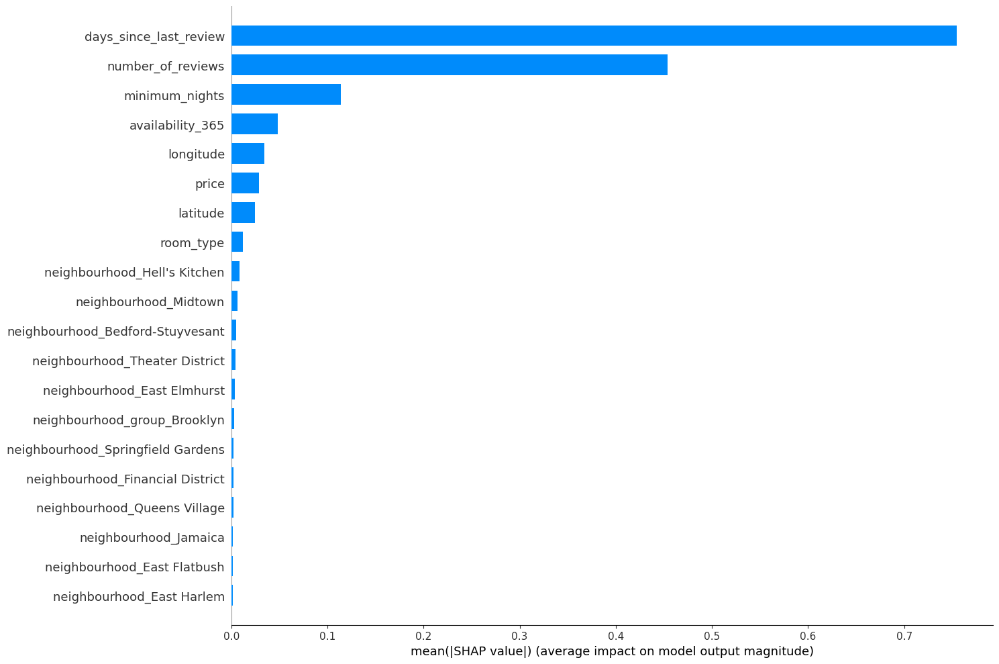

In [106]:
# Summary plot of the SHAP values
shap.summary_plot(test_shap_explanation.values, X_test_selected_enc, feature_names=feature_names, plot_type="bar", plot_size=(15, 10))

### Waterfall Plot

In [107]:
# transform transformed sparse matrix into dense numpy array
X_test_selected_enc_dense = X_test_selected_enc.toarray()
X_test_transformed_df = pd.DataFrame(X_test_selected_enc_dense, columns=feature_names)

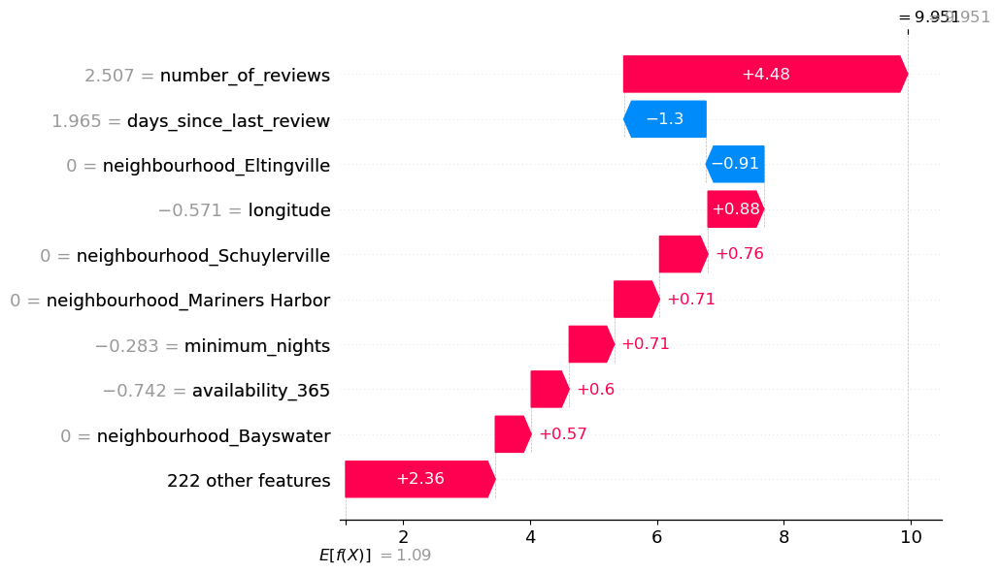

In [108]:
# build a waterfall plot for the second
test_transformed_shap_explanation = explainer(X_test_transformed_df)
shap.waterfall_plot(test_transformed_shap_explanation[1])

The waterfall plot for the second observation in the test set shows the prediction for the listing is 9.951 reviews per month. We can see that the `number_of_reviews` feature increased the prediction by 4.48 and the `days_since_last_review` feature decreased the prediction by 1.3.

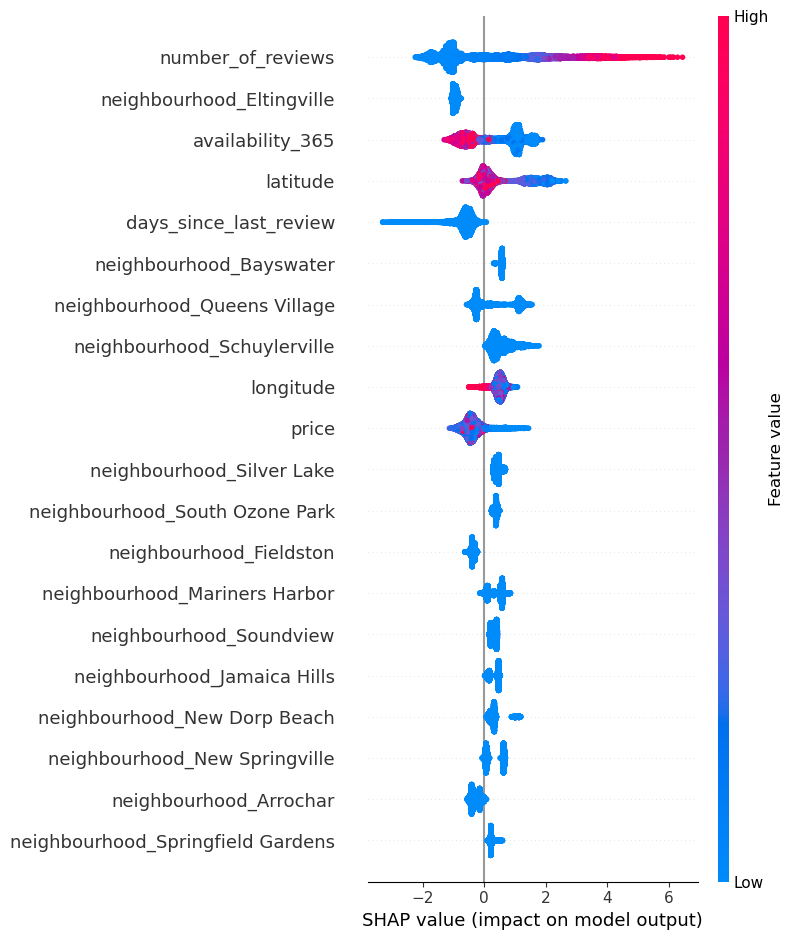

In [109]:
shap.summary_plot(test_transformed_shap_explanation, X_test_transformed_df)

### Analysis

As we can see from the summary plot, the two standout features that affect our prediction the most are `number_of_reviews` and `days_since_last_review`. Respectively, we can see from the waterfall plot that the `number_of_reviews` feature correlates positively with the target `reviews_per_month`, which is to be expected. Similarly we also expect that the feature `number_of_days_since_last_review` to be negatively correlated to `reviews_per_month`, which is exactly what the waterfall plot tells us as well. 

We can also observe that more numerical features like `latitude`, `longtude`, `price`, and `availability_365` also affect the target prediction, but their effects are less significant and the direction of impact is not overwhelmingly obvious.

Overall, we are pretty happy with our SHAP analysis as it made intuitive sense and verified our initial hypotheses that `number_of_reviews` would correlate positively with the target, and that `number_of_days_since_review` would be negatively correlated to the target. 

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 12. Results on the test set <a name="12"></a>
<hr>

rubric={points:10}

**Your tasks:**

1. Try your best performing model on the test data and report test scores. 
2. Do the test scores agree with the validation scores from before? To what extent do you trust your results? Do you think you've had issues with optimization bias? 
3. Take one or two test predictions and explain these individual predictions (e.g., with SHAP force plots).  

<div class="alert alert-warning">
    
Solution_12
    
</div>

_Points:_ 10

#### From our previous analysis, although the average VotingRegressor has the best RMSE score, but its fit / score times were slow compared to the other non-linear models. Specifically, we identified that the XGBoost Regressor achieved similar RMSE score and has a fast fit / score time. Therefore, I would say that the XGBoost Regressor is the model with the BEST performance.

In [110]:
# We will use our hyperparameter-optimized version of XGBoost Regressor...

optimized_xgb_pipe = make_pipeline(
    preprocessor_selected,
    optimized_xgb
)

optimized_xgb_pipe.fit(X_train_selected, y_train)

# make prediction on test set
y_pred = optimized_xgb_pipe.predict(X_test)

# calculate RMSE
optimized_xgb_test_score = np.sqrt(mean_squared_error(y_test, y_pred))

print(f"RMSE on test set (sklearn): {optimized_xgb_test_score:.4f}")

RMSE on test set (sklearn): 1.4017


In [111]:
optimized_xgb_test_score

np.float64(1.4016523436601882)

In [112]:
# Standard Deviation of target variable
print(np.std(y_test.squeeze()))

1.5562932022843456


#### Analysis of Test Score
It turns out that our test RMSE score with the XGBoost Regressor is around 1.4, which is higher than the mean validation score we got during cross-validation of around 0.9. This is actually quite unexpected, because we have identified the XGBoost Regressor as not only potentially mildly overfitting on the dataset in the section before. This gap between the the validation and test scores perhaps verifies the possibility that the XGBoost Regressor is indeed mildly overfitting.

However, we don't need to be overly worried, because even though the test RMSE score is higher, it is still smaller than the standard deviation of the target varaible in the test set, which is a threshold indicating that our regressor is still performing relatively well. Therefore, I would still trust the results.

Optimization bias can be caused by overfitting on the training set, which we have identified in this section due to the gap between the validation and test scores. So our XGBoost Regressor is a potential victim to optimization bias.

### SHAP Force Plots

In [113]:
shap.initjs()
shap.force_plot(explainer.expected_value, test_transformed_shap_explanation.values[1, :], X_test_transformed_df.iloc[1, :])

#### Analysis of Force Plot for Observation

As we can see in the force plot for the second observation in the test set, the predicted value of `reviews_per_month` for the listing is 9.95. We can interpret the force plot as two forces going against each, with the features in the red forces pushing the prediction higher and the features in the blue forces pushing the prediction lower. Following this method, we can see that the largest contributor to the red forces is the feature `number_of_reviews`, agreeing with our waterfall plot in the last section as expected. Similarly, the largest blue force is the feature `days_since_last_review`, which also verifies what we saw in the waterfall plot.

We would say that the features `longitude`, `number_of_reviews` positively correlates with our target, and the feature `days_since_last_review` negatively correlates with the target. As for the categorical features, we can interpret them in a similar way, with `0` representing the absence of the listing being in that specific category and `1` meaning that the listing belongs in that specific category. The absence or existence of that quality on a listing would then contribute to either pushing the prediction larger or smaller.


#### Force Plots or multiple observations together just for fun! 🤩

In [114]:
shap.force_plot(explainer.expected_value, test_transformed_shap_explanation.values[:5, :], X_test_transformed_df.iloc[:5, :])

In [115]:
shap.force_plot(explainer.expected_value, test_transformed_shap_explanation.values[:1000, :], X_test_transformed_df.iloc[:1000, :])

<!-- END QUESTION -->

<br><br>

<!-- BEGIN QUESTION -->

## 13. Summary of results <a name="13"></a>
<hr>
rubric={points:12}

Imagine that you want to present the summary of these results to your boss and co-workers. 

**Your tasks:**

1. Create a table summarizing important results. 
2. Write concluding remarks.
3. Discuss other ideas that you did not try but could potentially improve the performance/interpretability . 
3. Report your final test score along with the metric you used at the top of this notebook in the [Submission instructions section](#si).

<div class="alert alert-warning">
    
Solution_13
    
</div>

_Points:_ 12

_Type your answer here, replacing this text._

In [116]:
ridge_mean_train_score = np.mean(ridge_scores['train_score'])
rf_mean_train_score = np.mean(rf_scores['train_score'])
xgb_mean_train_score = np.mean(xgb_scores['train_score'])
lgbm_mean_train_score = np.mean(lgbm_scores['train_score'])
avg_mean_train_score = np.mean(avg_scores['train_score'])
optimized_avg_mean_train_score = np.mean(optimized_avg_scores['train_score'])

ridge_mean_val_score = np.mean(ridge_scores['test_score'])
rf_mean_val_score = np.mean(rf_scores['test_score'])
xgb_mean_val_score = np.mean(xgb_scores['test_score'])
lgbm_mean_val_score = np.mean(lgbm_scores['test_score'])
avg_mean_val_score = np.mean(avg_scores['test_score'])
optimized_avg_mean_val_score = np.mean(optimized_avg_scores['test_score'])

ridge_mean_fit_time = np.mean(ridge_scores['fit_time'])
rf_mean_fit_time  = np.mean(rf_scores['fit_time'])
xgb_mean_fit_time  = np.mean(xgb_scores['fit_time'])
lgbm_mean_fit_time  = np.mean(lgbm_scores['fit_time'])
avg_mean_fit_time  = np.mean(avg_scores['fit_time'])
optimized_avg_mean_fit_time  = np.mean(optimized_avg_scores['fit_time'])

ridge_mean_score_time = np.mean(ridge_scores['score_time'])
rf_mean_score_time = np.mean(rf_scores['score_time'])
xgb_mean_score_time = np.mean(xgb_scores['score_time'])
lgbm_mean_score_time = np.mean(lgbm_scores['score_time'])
avg_mean_score_time = np.mean(avg_scores['score_time'])
optimized_avg_mean_score_time = np.mean(optimized_avg_scores['score_time'])



model_names = ['Ridge', 'Random Forest Regressor', 'XGBoost Regressor', 'LightGBM Regressor', 
               'Average VotingRegressor', 'Optimized Average VotingRegressor']

training_scores = [ridge_mean_train_score, rf_mean_train_score, xgb_mean_train_score, lgbm_mean_train_score, 
                   avg_mean_train_score, optimized_avg_mean_train_score]

val_scores = [ridge_mean_val_score, rf_mean_val_score, xgb_mean_val_score, lgbm_mean_val_score, avg_mean_val_score, 
              optimized_avg_mean_val_score]

fit_times = [ridge_mean_fit_time, rf_mean_fit_time, xgb_mean_fit_time, lgbm_mean_fit_time, avg_mean_fit_time, 
              optimized_avg_mean_fit_time]

score_times = [ridge_mean_score_time, rf_mean_score_time, xgb_mean_score_time, lgbm_mean_score_time, avg_mean_score_time, 
              optimized_avg_mean_score_time]

summary_table = pd.DataFrame({'Model': model_names, 
                              'Mean Fit Time': fit_times, 
                              'Mean Score Time': score_times, 
                              'Mean Training Scores (RMSE)': training_scores,
                              'Mean Validation Scores (RMSE)':val_scores})

summary_table

,Model,Mean Fit Time,Mean Score Time,Mean Training Scores (RMSE),Mean Validation Scores (RMSE)
0,Ridge,0.190127,0.015870,1.153336,1.161612
1,Random Forest Regressor,17.348238,0.054592,0.338619,0.895928
2,XGBoost Regressor,0.445791,0.024240,0.651450,0.901661
3,LightGBM Regressor,0.468117,0.028009,0.749854,0.885611
4,Average VotingRegressor,18.545901,0.083200,0.560766,0.874962
5,Optimized Average VotingRegressor,91.695351,0.194043,0.549995,0.872260


This table above sums up the results we attained in this project.  

In [117]:
print(f'Standard Deviation of target (training): {np.std(y_train.squeeze())}')

Standard Deviation of target (training): 1.614508193100307


### Summary of Results

We can see that in terms of fit / score time, the Ridge regressor is better than all of the non-linear models. The Random Forest Regressor took magnitudes longer than the other non-linear models to fit, causing the VotingRegressor to have a slow fit time as well. The XGBoost and LightGBM regressors both have a respectable fit time of under 0.3 seconds, which makes them more suitable and realistic non-linear models than the Random Forest regressor.

We then shift our focus to the RMSE training and validation scores. We can see that among the non-linear models, the Random Forest regression has the biggest gap between the training and validation score, indicating that it is overfitting the most. While the XGBoost and LightGBM regressors also have a gap between the training and validation scores, they are not as significant and are only potentially mildly overfitting. Since we are using RMSE as our scoring metric, it is easy to interpret our scores - they simply represent the average absolute difference between the predicted values and the actual values of the `reviews_per_month` target. Therefore, the lower the RMSE, the better the model is performing. Furthermore, if the RMSE is lower than the standard deviation of the target variable (1.6 in this case), then the model is considered to be performing well, and we can see that it is the case here for all non-linear models.

**Overall, I would choose either the XGBoost regressor or the LightGBM regressor as our model of choice.**
- I would choose XGBoost because it has faster fit / score time than all of the non-linear models and has just a slightly higher RMSE compared to LightGBM.
- I would choose LightGBM because it has a smaller gap between training and validation score, which indicates a lower chance of overfitting and would likely generalize better on the testing set.

### Ideas that could potentially improve performance / interpretability

One of the ideas that could potentially increase the performance of our models is addressing potential imbalance in the dataset. We didn't focus on addressing this problem because it is more of a problem in classification problems, but in reality it can still arise in regression problems. There is a variant of SMOTE for regression (SMOTER), which, instead of balancing discrete classes, oversamples instances where the target variable is underrepresented in the dataset. For example, there may be a very few listings with `reviews_per_month` over 20, so SMOTER would generate "synthetic" samples in those regions in order to make the model perform better when encountering future samples on the edges of our target space.

In terms of interpretability, an alternative method of observing feature impacts on predictions to SHAP include Partial Dependence Plots (PDP), which focuses on one feature at a time and shows how that feature affects the prediction value while keeping other features constant. However, I would say our models are overall already relatively interpretable with SHAP analysis.

### Test Score: RMSE

In [118]:
print(f'Optimized XGBoost Regressor RMSE score on the test set: {optimized_xgb_test_score}')

Optimized XGBoost Regressor RMSE score on the test set: 1.4016523436601882


In [119]:
print(f'Standard Deviation of target (testing): {np.std(y_test.squeeze())}')

Standard Deviation of target (testing): 1.5562932022843456


We used the hyperparameter-optimized version of XGBoost regressor to produce a RMSE score on the test set. The test RMSE score is considerably higher than the validation score, but is still within the standard deviation of the target variable. Therefore, we can say that our model generalizes pretty well overall.

<!-- END QUESTION -->

<br><br>

<br><br>

<!-- BEGIN QUESTION -->

## 14. Your takeaway <a name="15"></a>
<hr>
rubric={points:2}

**Your tasks:**

What is your biggest takeaway from the supervised machine learning material we have learned so far? Please write thoughtful answers.  

<div class="alert alert-warning">
    
Solution_14
    
</div>

_Points:_ 2

I would say that my biggest takeaway from the supervised machine learning material so far is that building a machine learning project is a constant process of readjustment and reiteration. We need to be flexible and have the ability to progress in a non-linear workflow, meaning that sometimes we may realize a problem in a later step and go back to a previous step to fix it, and repeat. For example, in this project I had to go back and forth a number of times between data preprocessing and feature engineering, as the two steps depend on each other and are deeply intertwined. However, it was exactly this process that keeps improving the data that I feed into my models, which is the most important thing - the model needs good data to give good predictions. I've come to realize that this constant iterative process of going back and forth between steps in the workflow is incredibly important in building a successful machine learning project. In fact, if I was to improve this project further, I would again start playing around with the data to see if I can create new features that improve the performance of our models, and if not, remove them and try new ones... I've really learned a lot from this project as it gave me first-person view on what a self-constructed machine learning project process may look like. 

<!-- END QUESTION -->

<br><br>

**PLEASE READ BEFORE YOU SUBMIT:** 

When you are ready to submit your assignment do the following:

1. Run all cells in your notebook to make sure there are no errors by doing `Kernel -> Restart Kernel and Clear All Outputs` and then `Run -> Run All Cells`. 
2. Notebooks with cell execution numbers out of order or not starting from "1" will have marks deducted. Notebooks without the output displayed may not be graded at all (because we need to see the output in order to grade your work).
4. Upload the assignment using Gradescope's drag and drop tool. Check out this [Gradescope Student Guide](https://lthub.ubc.ca/guides/gradescope-student-guide/) if you need help with Gradescope submission. 
5. Make sure that the plots and output are rendered properly in your submitted file. If the .ipynb file is too big and doesn't render on Gradescope, also upload a pdf or html in addition to the .ipynb so that the TAs can view your submission on Gradescope. 

This was a tricky one but you did it! 

![](img/eva-well-done.png)